In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

# 2017



In [2]:
df = pd.read_csv('2013_tbi_rate_vs_matuarity.csv')
taget = 'target'
nrows , ncols = df.shape
df.head()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
0,0.5,2.06,2.27,2.09,1.81,1.36,1.04,0.85,1.05,1.51,1.78,1.75,1.62
1,1.0,2.02,2.22,2.10,1.84,1.49,1.23,1.07,1.21,1.56,1.75,1.73,1.63
2,1.5,1.99,2.19,2.10,1.87,1.61,1.39,1.27,1.36,1.61,1.73,1.73,1.65
3,2.0,1.97,2.16,2.10,1.90,1.69,1.52,1.42,1.47,1.65,1.73,1.74,1.68
4,2.5,1.97,2.14,2.10,1.91,1.75,1.60,1.53,1.55,1.69,1.75,1.76,1.72


In [3]:
df.describe()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
count,200.000000,200.000000,200.000000,200.000000,200.000000,200.00000,200.00000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000
mean,50.250000,2.274900,2.272350,2.273750,2.217700,2.13330,2.00245,2.000550,1.975200,2.044100,2.081050,2.065150,2.079350
std,28.939592,0.159169,0.121952,0.127907,0.158446,0.16815,0.17432,0.183473,0.161926,0.146782,0.144644,0.132506,0.129285
min,0.500000,1.960000,2.020000,2.000000,1.810000,1.36000,1.04000,0.850000,1.050000,1.510000,1.730000,1.730000,1.620000
25%,25.375000,2.177500,2.217500,2.207500,2.147500,2.07750,1.94750,1.957500,1.927500,1.977500,2.007500,1.997500,2.020000
50%,50.250000,2.350000,2.330000,2.330000,2.290000,2.21000,2.08000,2.080000,2.050000,2.110000,2.150000,2.130000,2.140000
75%,75.125000,2.400000,2.360000,2.370000,2.340000,2.25000,2.12000,2.110000,2.080000,2.150000,2.190000,2.170000,2.170000
max,100.000000,2.420000,2.380000,2.390000,2.360000,2.27000,2.14000,2.130000,2.090000,2.170000,2.210000,2.190000,2.190000


In [4]:
df.cov()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
Matuarity,837.500000,4.087010,3.015741,3.294510,4.079523,4.143065,4.151043,4.138430,3.749799,3.733266,3.776068,3.456068,3.270791
Jan,4.087010,0.025335,0.019033,0.020194,0.024835,0.024861,0.024903,0.024618,0.022518,0.022523,0.022754,0.020817,0.019636
Feb,3.015741,0.019033,0.014872,0.015342,0.018282,0.017475,0.017148,0.016392,0.015232,0.016085,0.016681,0.015201,0.013855
Mar,3.294510,0.020194,0.015342,0.016360,0.019983,0.019892,0.019785,0.019393,0.017753,0.017905,0.018170,0.016570,0.015451
Apr,4.079523,0.024835,0.018282,0.019983,0.025105,0.025937,0.026177,0.026270,0.023789,0.022969,0.022781,0.020816,0.019945
May,4.143065,0.024861,0.017475,0.019892,0.025937,0.028274,0.029139,0.030095,0.026847,0.024468,0.023439,0.021518,0.021372
June,4.151043,0.024903,0.017148,0.019785,0.026177,0.029139,0.030387,0.031739,0.028141,0.025082,0.023661,0.021817,0.022007
July,4.138430,0.024618,0.016392,0.019393,0.026270,0.030095,0.031739,0.033663,0.029636,0.025675,0.023774,0.021997,0.022676
Aug,3.749799,0.022518,0.015232,0.017753,0.023789,0.026847,0.028141,0.029636,0.026220,0.023038,0.021545,0.019893,0.020311
Sept,3.733266,0.022523,0.016085,0.017905,0.022969,0.024468,0.025082,0.025675,0.023038,0.021545,0.020961,0.019250,0.018893


In [5]:
df.var()

Matuarity    837.500000
Jan            0.025335
Feb            0.014872
Mar            0.016360
Apr            0.025105
May            0.028274
June           0.030387
July           0.033663
Aug            0.026220
Sept           0.021545
Oct            0.020922
Nov            0.017558
Dec            0.016715
dtype: float64

In [6]:
df.head()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
0,0.5,2.06,2.27,2.09,1.81,1.36,1.04,0.85,1.05,1.51,1.78,1.75,1.62
1,1.0,2.02,2.22,2.10,1.84,1.49,1.23,1.07,1.21,1.56,1.75,1.73,1.63
2,1.5,1.99,2.19,2.10,1.87,1.61,1.39,1.27,1.36,1.61,1.73,1.73,1.65
3,2.0,1.97,2.16,2.10,1.90,1.69,1.52,1.42,1.47,1.65,1.73,1.74,1.68
4,2.5,1.97,2.14,2.10,1.91,1.75,1.60,1.53,1.55,1.69,1.75,1.76,1.72


In [7]:
name = df.columns[1:]

In [8]:
col = list(df)
col.remove('Matuarity')
df['sum']=(df[col].sum(axis=1))/12

In [9]:
l1=list(df['sum'])
mat = list(df.iloc[:,0])

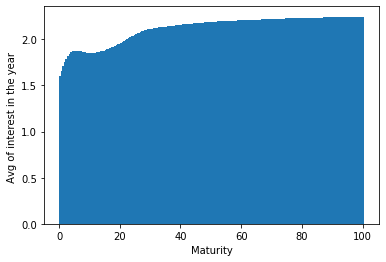

In [10]:
plt.bar(mat,l1)
plt.xlabel("Maturity")
plt.ylabel(" Avg of interest in the year  ")
plt.show()

Saturation point hence recieved is : ---> 12 weeks

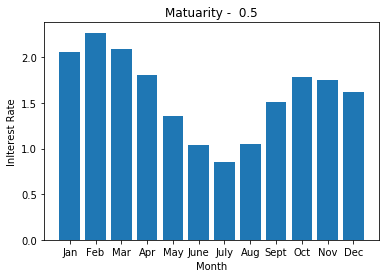

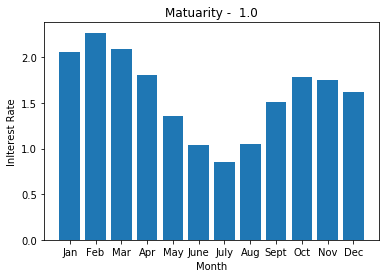

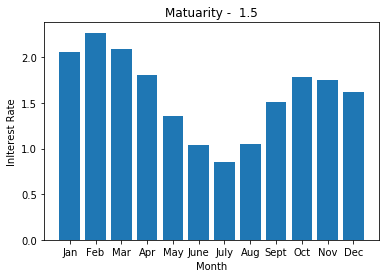

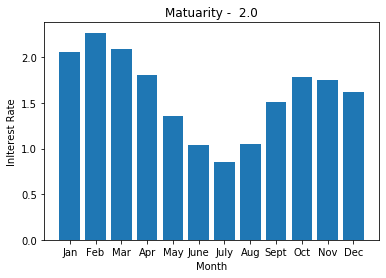

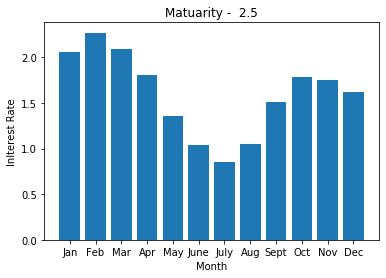

...

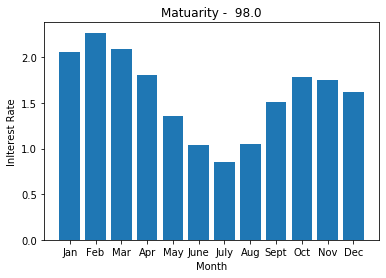

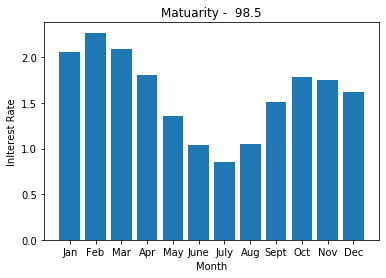

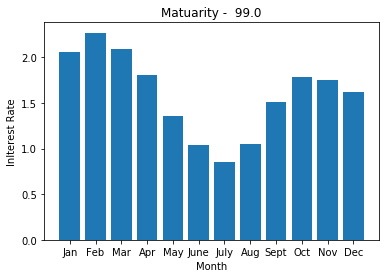

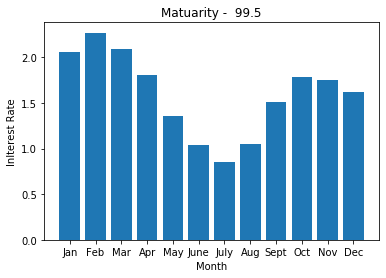

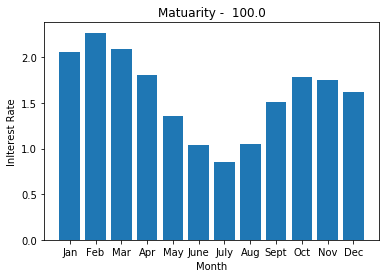

In [11]:
for i in range(0,len(df)):
    l = list(df.iloc[0,1:-1])
    plt.bar(name , l)
    plt.xlabel("Month")
    plt.ylabel("Inlterest Rate")
    plt.title("Matuarity -  "+str(df.iloc[i,0]))
    plt.show()
   

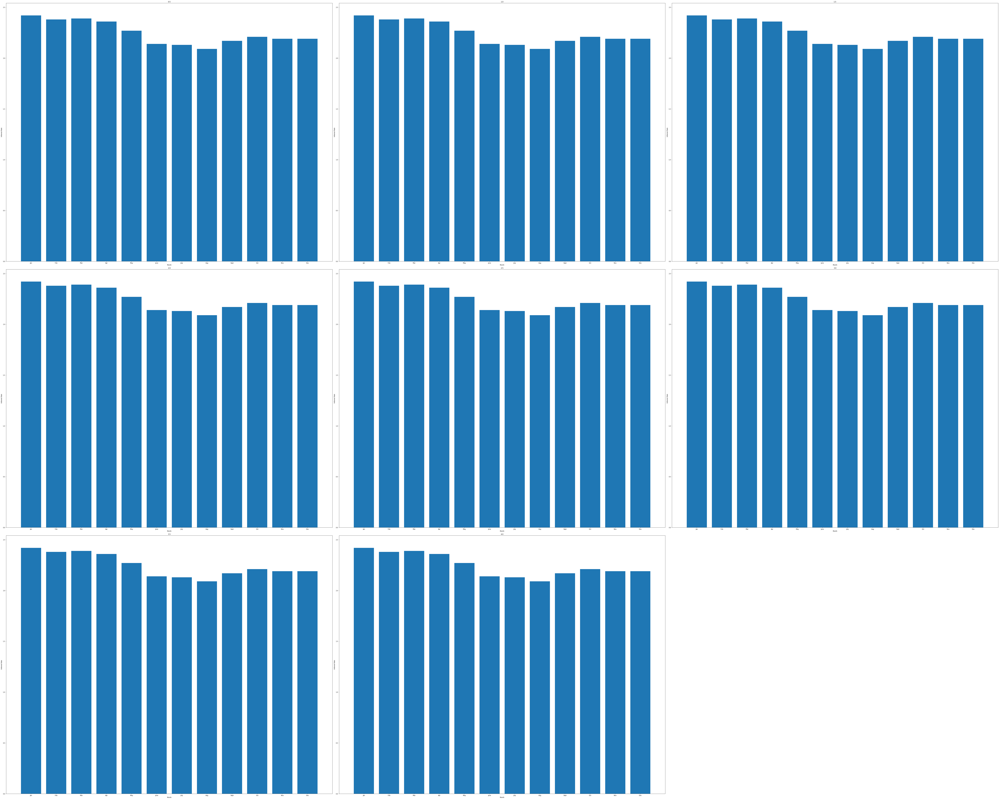

In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(100,80))

for c,num in zip(mat, range(1,9)):
    df0=df[df['Matuarity']==c]
    l = list(df.iloc[i-1,1:-1])
    ax = fig.add_subplot(3,3,num)
    ax.bar(name , l)
    ax.set_xlabel("Month")
    ax.set_ylabel("Inlterest Rate")
    ax.set_title(c)

plt.tight_layout()
plt.show()

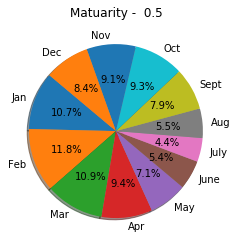

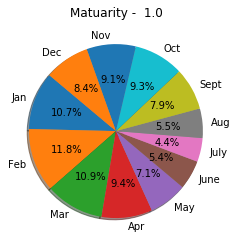

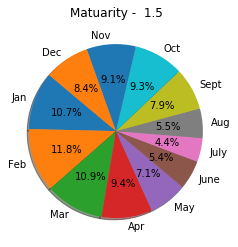

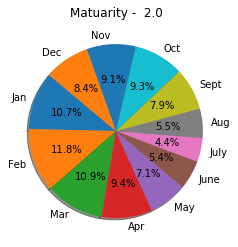

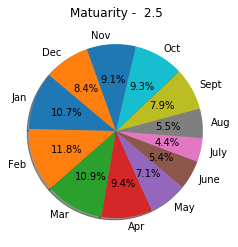

...

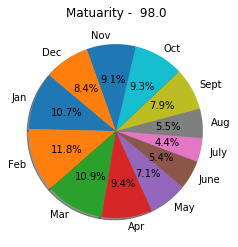

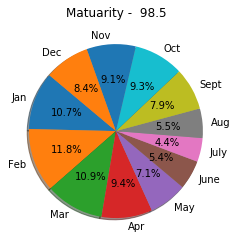

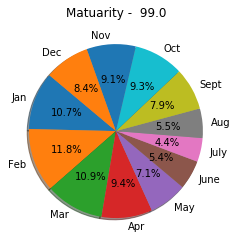

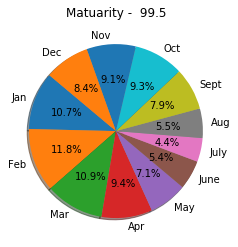

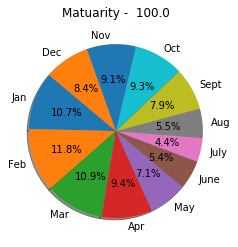

In [13]:
for i in range(0,len(df)):
    l = list(df.iloc[0,1:-1])
    plt.pie(l, labels=name, 
    autopct='%1.1f%%', shadow=True, startangle=140)
    plt.title("Matuarity -  "+str(df.iloc[i,0]))
    plt.show()
   

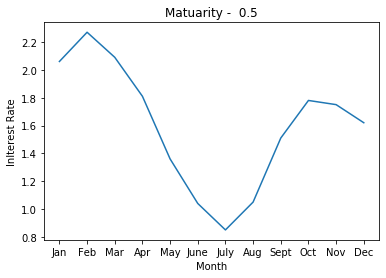

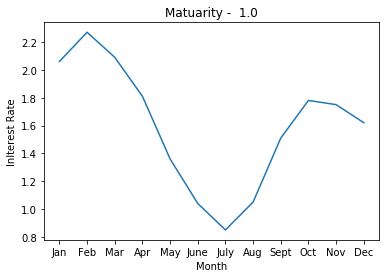

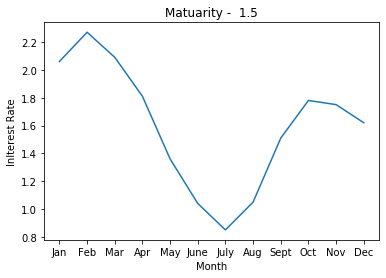

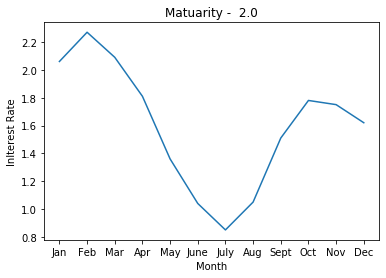

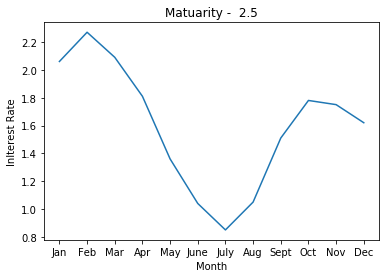

...

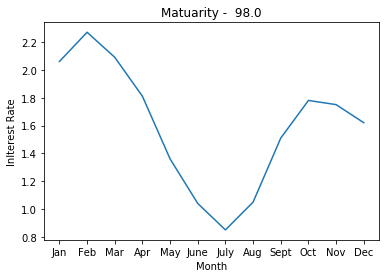

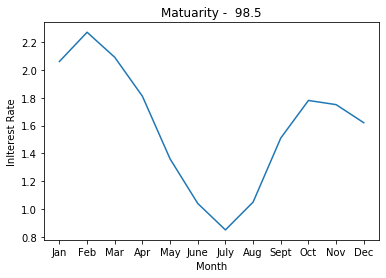

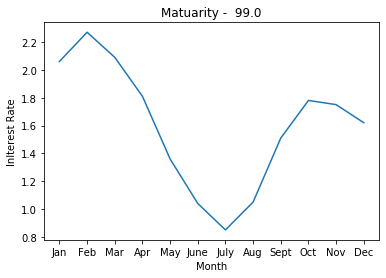

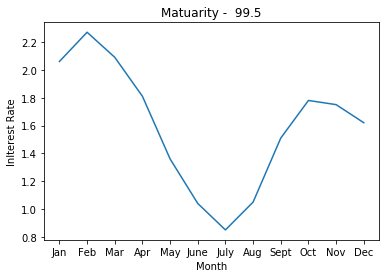

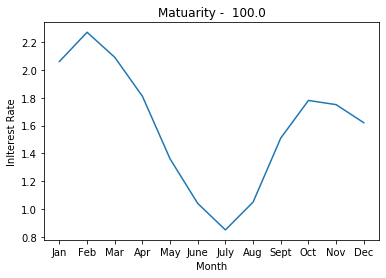

In [15]:
for i in range(0,len(df)):
    l = list(df.iloc[0,1:-1])
    plt.plot(name , l)
    plt.xlabel("Month")
    plt.ylabel("Inlterest Rate")
    plt.title("Matuarity -  "+str(df.iloc[i,0]))
    plt.show()

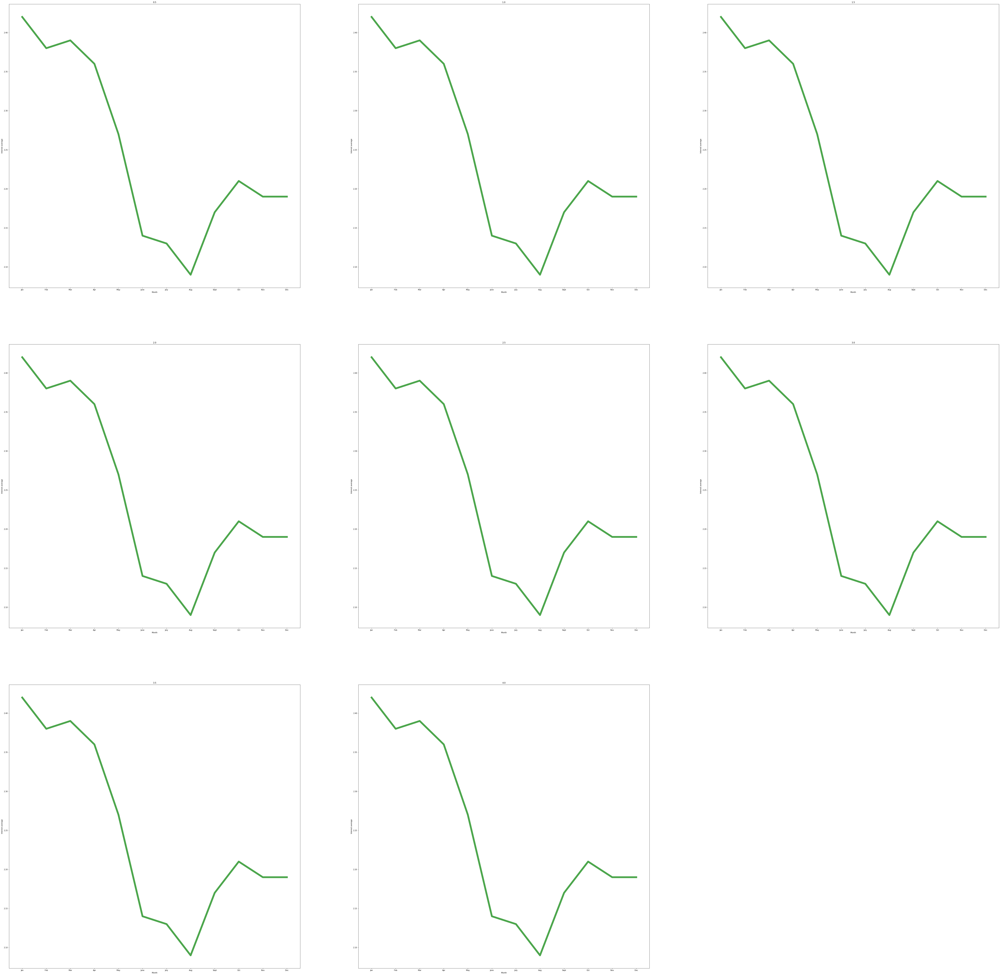

In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(100,100))

for c,num in zip(mat, range(1,9)):
    df0=df[df['Matuarity']==c]
    l = list(df.iloc[i-1,1:-1])
    ax = fig.add_subplot(3,3,num)
    ax.plot(name, l ,color = 'g',linewidth=10, alpha=0.7 )
    ax.set_xlabel('Month')
    ax.set_ylabel('Interest average')
    ax.set_title(c)


plt.show()

In [17]:
avg_interest_among_all_matuarity = df['sum'].sum()/200

2.1183208333333337